In [1]:
# Import libraries:
import numpy as np
from matplotlib import pyplot as plt
from scipy.interpolate import interp1d

import sys
import os
parent_dir = os.path.abspath(os.path.join(os.getcwd(), '..'))
sys.path.append(parent_dir)
from functions.set_plot_settings import setPlotSettings
setPlotSettings(font=True)
from functions.read_g4bl_data import readTraceData

# Length of period:
len_period = 4200 # mm

# Load data from output txt files:
# file = 'g4bl-output-offset/AllTracks_dp_neg_dxy_extended.txt'
file = 'g4bl-output-offset/AllTracks_dp_neg_dxy_extended2.txt'
data = np.loadtxt(file)

# Note particle offset for plot labels:
p_offset = 199.9 # MeV/c
# p_offset = 201 # MeV/c

# The same for the nominal particle:
# file_ref = 'g4bl-output-offset/AllTracks_nominal_extended.txt'
file_ref = 'g4bl-output-offset/AllTracks_nominal_extended2.txt'
data_ref = np.loadtxt(file_ref)
p_ref = 200 # MeV/c

# Figure directory:
fig_dir = 'figures/'

In [3]:
# Values along channel -- for offset particle:
x_vals = []; y_vals = []; z_vals = []
px_vals = []; py_vals = []; pz_vals = []; ptotal_vals = []
t_vals = []
Bx_vals = []; By_vals = []; Bz_vals = []
next_z = 0.5; period_start_z_vals = []; period_start_indices = [] # start solenoid placement at 0.5m
p_perp_vals = []
for i in range(data.shape[0]):
    x_vals.append(data[i][0]) # mm
    y_vals.append(data[i][1])
    z = data[i][2]
    z_vals.append(z)
    px = data[i][3]; py = data[i][4]; pz = data[i][5]
    px_vals.append(px) # MeV/c
    py_vals.append(py)
    pz_vals.append(pz)
    ptotal_vals.append(np.sqrt(px**2+py**2+pz**2))
    p_perp_vals.append(np.sqrt(px**2+py**2))
    t_vals.append(data[i][6]) # ns
    Bx_vals.append(data[i][12])
    By_vals.append(data[i][13])
    Bz_vals.append(data[i][14])

    # Find indices for first value in each period:
    if z > next_z:
        period_start_z_vals.append(z)
        period_start_indices.append(i)
        next_z += len_period

# Remove extra periods on the end -- just for reducing fringe field effects:
start_last_period = period_start_indices[len(period_start_indices)-2]
x_vals = x_vals[:start_last_period]
y_vals = y_vals[:start_last_period]
z_vals = z_vals[:start_last_period]
px_vals = px_vals[:start_last_period]
py_vals = py_vals[:start_last_period]
pz_vals = pz_vals[:start_last_period]
p_perp_vals = p_perp_vals[:start_last_period]
t_vals = t_vals[:start_last_period]
Bx_vals = Bx_vals[:start_last_period]
By_vals = By_vals[:start_last_period]
Bz_vals = Bz_vals[:start_last_period]

In [4]:
# Values along channel -- for reference particle:
x_vals_ref = []; y_vals_ref = []; z_vals_ref = []
px_vals_ref = []; py_vals_ref = []; pz_vals_ref = []; ptotal_vals_ref = []
t_vals_ref = []
Bx_vals_ref = []; By_vals_ref = []; Bz_vals_ref = []
p_perp_vals_ref = []
for i in range(data_ref.shape[0]):
    x_vals_ref.append(data_ref[i][0]) # mm
    y_vals_ref.append(data_ref[i][1])
    z_ref = data_ref[i][2]
    z_vals_ref.append(z_ref)
    px_ref = data_ref[i][3]; py_ref = data_ref[i][4]; pz_ref = data_ref[i][5]
    px_vals_ref.append(px_ref) # MeV/c
    py_vals_ref.append(py_ref)
    pz_vals_ref.append(pz_ref)
    ptotal_vals_ref.append(np.sqrt(px_ref**2+py_ref**2+pz_ref**2))
    p_perp_vals_ref.append(np.sqrt(px_ref**2+py_ref**2))
    t_vals_ref.append(data_ref[i][6]) # ns
    Bx_vals_ref.append(data_ref[i][12])
    By_vals_ref.append(data_ref[i][13])
    Bz_vals_ref.append(data_ref[i][14])

# Remove extra periods on the end -- just for reducing fringe field effects:
start_last_period = period_start_indices[len(period_start_indices)-2]
x_vals_ref = x_vals_ref[:start_last_period]
y_vals_ref = y_vals_ref[:start_last_period]
z_vals_ref = z_vals_ref[:start_last_period]
px_vals_ref = px_vals_ref[:start_last_period]
py_vals_ref = py_vals_ref[:start_last_period]
pz_vals_ref = pz_vals_ref[:start_last_period]
p_perp_vals_ref = p_perp_vals_ref[:start_last_period]
t_vals_ref = t_vals_ref[:start_last_period]
Bx_vals_ref = Bx_vals_ref[:start_last_period]
By_vals_ref = By_vals_ref[:start_last_period]
Bz_vals_ref = Bz_vals_ref[:start_last_period]

In [5]:
# Define function for plotting lines to represent period start and end locations:
def plot_periods(ax):
    for i in range(len(z_vals)):
        if z_vals[i] in period_start_z_vals:
            ax.axvline(z_vals[i], color='black', linewidth=0.5, zorder=-10)
    ax.axvline(z_vals[i], color='black', linewidth=0.5, zorder=-10)

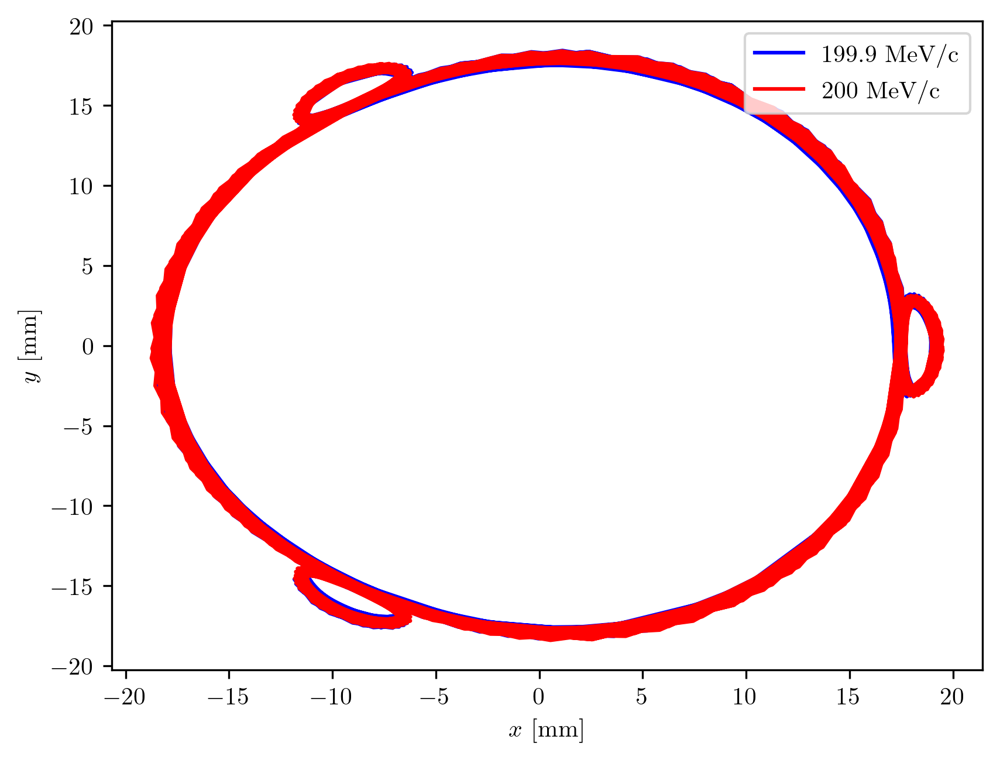

In [69]:
# Plot projection in x-y plane:
plt.figure()
plt.plot(x_vals,y_vals,color='blue',label=f'{p_offset} MeV/c')
plt.plot(x_vals_ref,y_vals_ref,color='red',label=f'{p_ref} MeV/c')
plt.xlabel('$x$ [mm]')
plt.ylabel('$y$ [mm]')
plt.legend(loc='upper right')
plt.show()

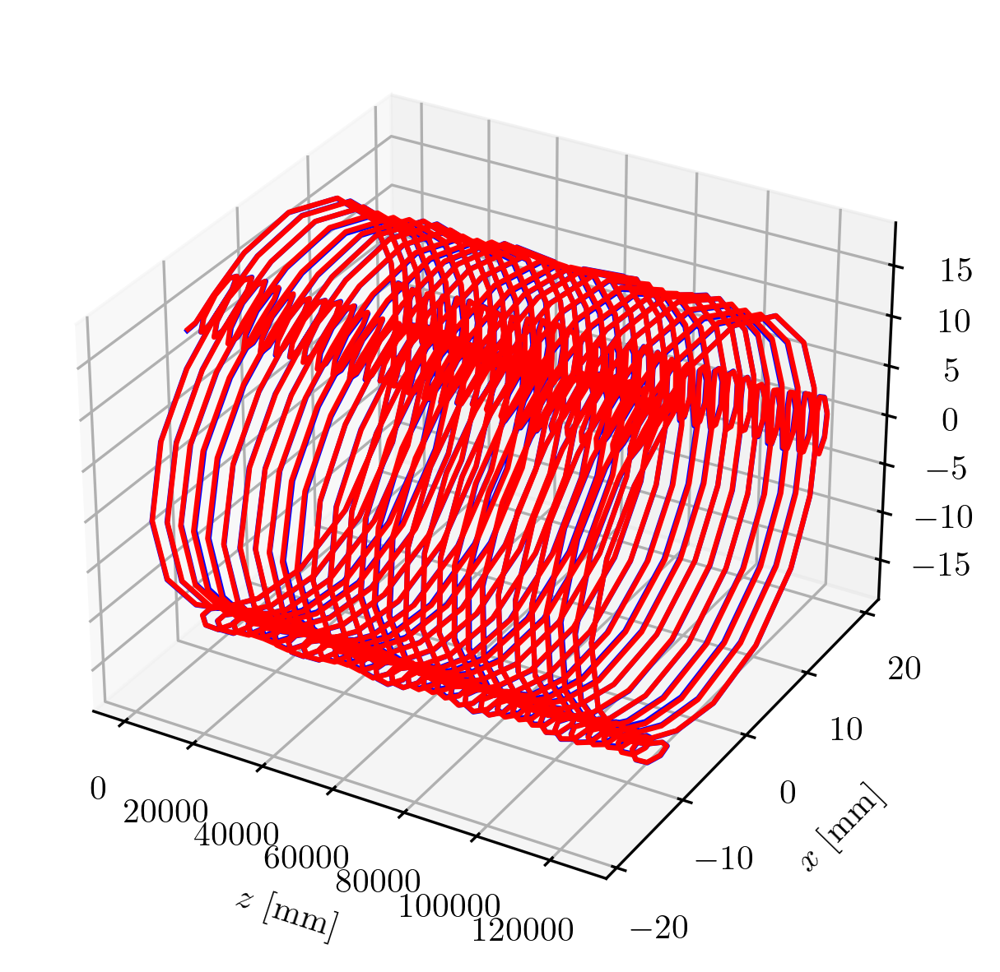

In [70]:
# 3D plot of trajectory:
# %matplotlib widget
fig = plt.figure()
ax = fig.add_subplot(111,projection='3d')
ax.plot(z_vals,x_vals,y_vals,color='blue',label=f'{p_offset} MeV/c')
ax.plot(z_vals_ref,x_vals_ref,y_vals_ref,color='red',label='200 MeV/c')
ax.set_xlabel('$z$ [mm]')
ax.set_ylabel('$x$ [mm]')
ax.set_zlabel('$y$ [mm]')
plt.show()

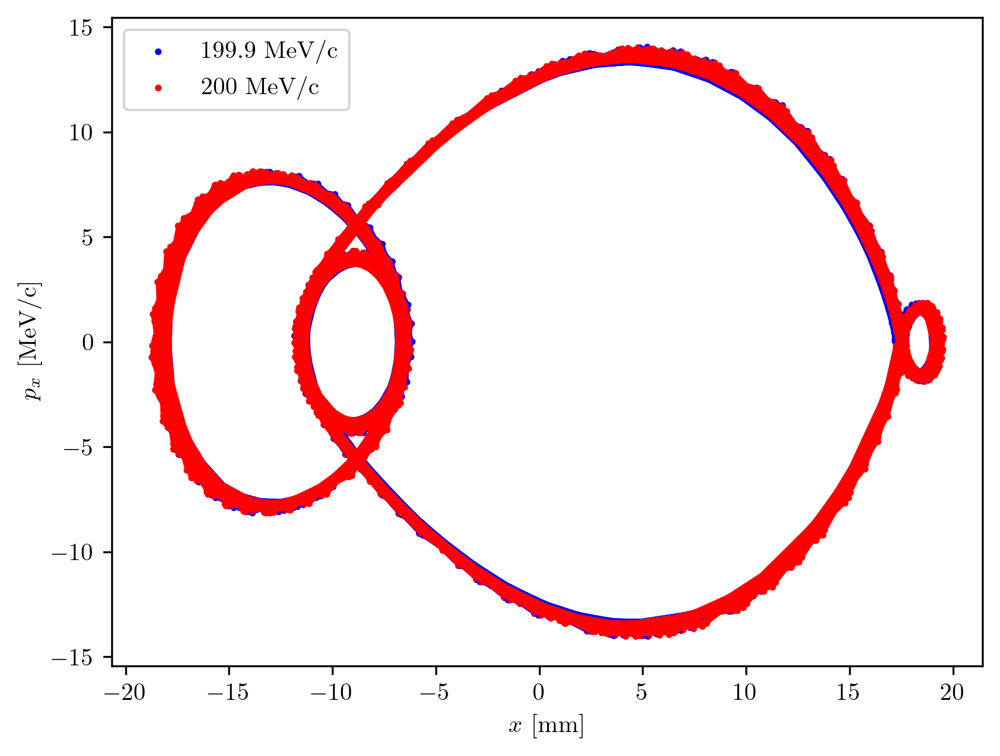

In [74]:
# Plot phase space trajectory (x):
plt.figure()
plt.scatter(x_vals,px_vals,s=3,color='blue',label=f'{p_offset} MeV/c')
plt.plot(x_vals,px_vals,color='blue')
plt.scatter(x_vals_ref,px_vals_ref,s=3,color='red',label=f'{p_ref} MeV/c')
plt.plot(x_vals_ref,px_vals_ref,color='red')
plt.xlabel('$x$ [mm]')
plt.ylabel('$p_x$ [MeV/c]')
plt.legend(loc='upper left')
plt.show()

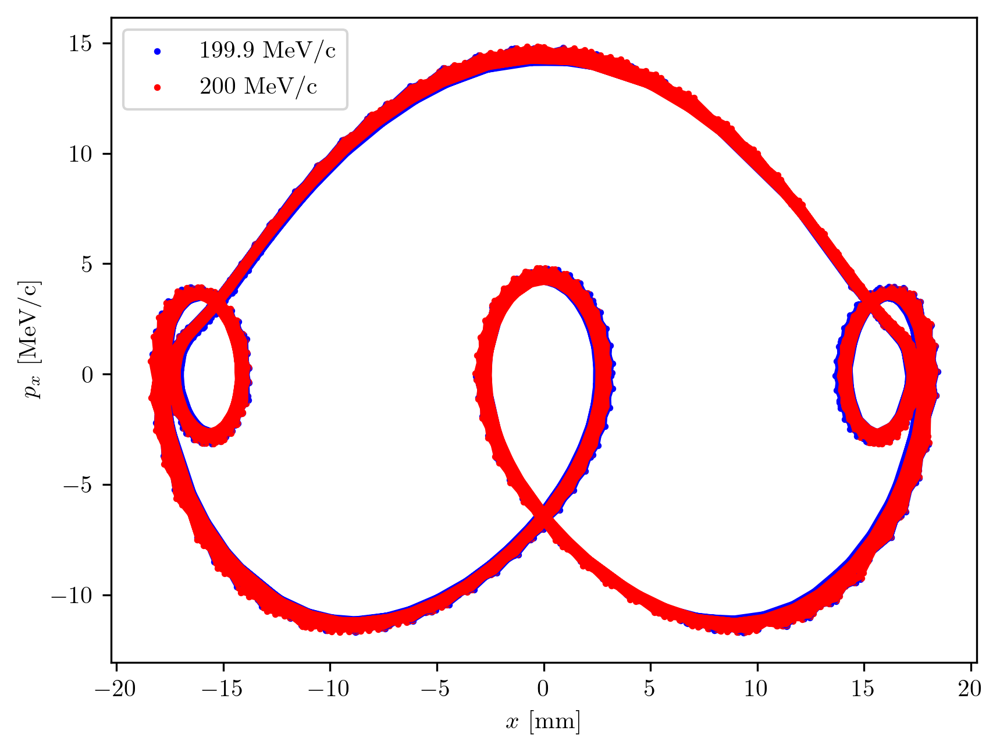

In [75]:
# Plot phase space trajectory (y):
plt.figure()
plt.scatter(y_vals,py_vals,s=3,color='blue',label=f'{p_offset} MeV/c')
plt.plot(y_vals,py_vals,color='blue')
plt.scatter(y_vals_ref,py_vals_ref,s=3,color='red',label=f'{p_ref} MeV/c')
plt.plot(y_vals_ref,py_vals_ref,color='red')
plt.xlabel('$x$ [mm]')
plt.ylabel('$p_x$ [MeV/c]')
plt.legend(loc='upper left')
plt.show()

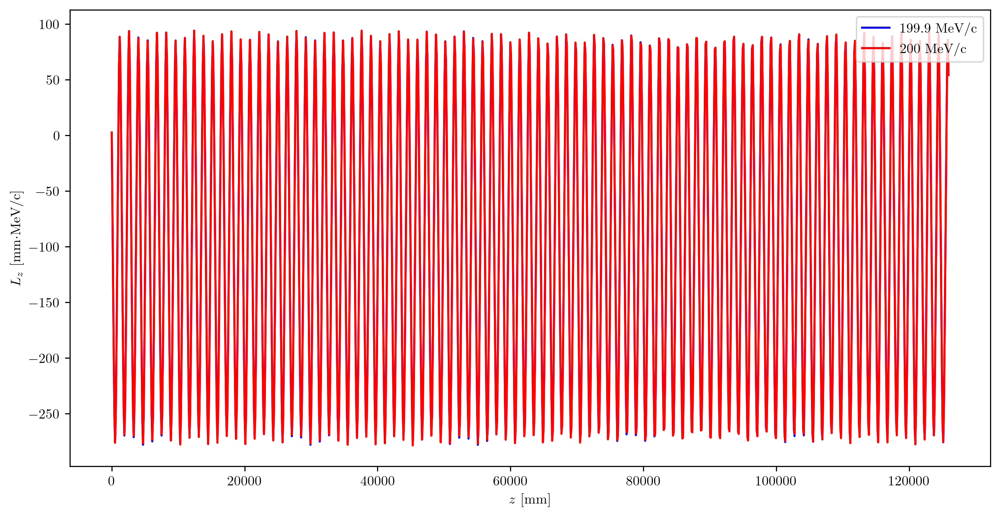

In [81]:
# Plot angular momentum:
# %matplotlib widget
Lz_vals = []; Lz_vals_ref = []
for i in range(len(z_vals)):
    Lz = x_vals[i]*py_vals[i]-y_vals[i]*px_vals[i]
    Lz_vals.append(Lz)
    Lz_ref = x_vals_ref[i]*py_vals_ref[i]-y_vals_ref[i]*px_vals_ref[i]
    Lz_vals_ref.append(Lz_ref)
plt.figure(figsize = (12,6))
plt.plot(z_vals,Lz_vals,color='blue',label=f'{p_offset} MeV/c')
plt.plot(z_vals_ref,Lz_vals_ref,color='red',label=f'{p_ref} MeV/c')
plt.xlabel('$z$ [mm]')
plt.ylabel(r'$L_z$ [mm$\cdot$MeV/c]')
plt.legend(loc='upper right')
plt.show()

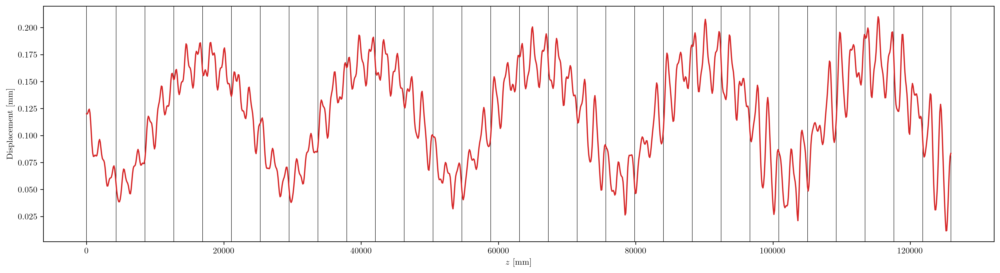

In [97]:
# Plot displacement from reference particle along channel:
fig, ax = plt.subplots(figsize=(20,5))
plot_periods(ax)
displacements = []
for i in range(len(x_vals)):
    displacements.append(np.sqrt( (x_vals_ref[i] - x_vals[i])**2 + (y_vals_ref[i] - y_vals[i])**2 ))
plt.plot(z_vals,displacements, color='tab:red')
plt.xlabel('$z$ [mm]')
plt.ylabel('Displacement [mm]')
plt.show()

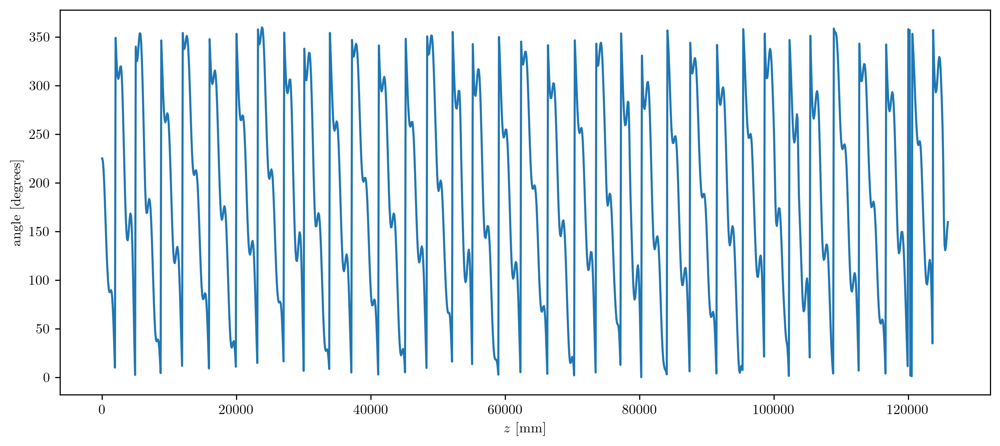

In [108]:
# Plot angle w.r.t. reference particle along channel:
angles = []
for i in range(len(x_vals)):
    x = x_vals_ref[i] - x_vals[i]
    y = y_vals_ref[i] - y_vals[i]
    angle = np.degrees(np.arctan2(-y,-x))
    if angle < 0:
        angle += 360
    angles.append(angle)
plt.figure(figsize=(12,5))
plt.plot(z_vals,angles)
plt.xlabel('$z$ [mm]')
plt.ylabel('angle [degrees]')
plt.show()

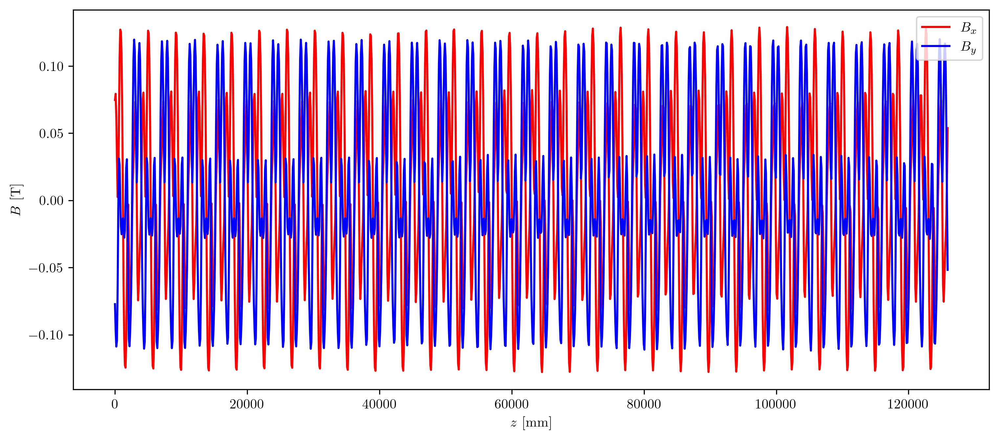

In [109]:
# Plot B field along channel:
plt.figure(figsize=(12,5))
plt.plot(z_vals,Bx_vals,color='red',label='$B_x$')
plt.plot(z_vals,By_vals,color='blue',label='$B_y$')
plt.xlabel('$z$ [mm]')
plt.ylabel('$B$ [T]')
plt.legend(loc='upper right')
plt.show()

In [23]:
# # Animate displacement vector:
# dx = []; dy = []
# for i in range(len(x_vals)):
#     dx.append(x_vals[i] - x_vals_ref[i])
#     dy.append(y_vals[i] - y_vals_ref[i])
# fig, ax = plt.subplots()
# ax.set_aspect('equal')
# # ax.set_xlim(-0.25, 0.25)
# # ax.set_ylim(-0.25, 0.25)
# ax.set_xlim(-0.025, 0.025)
# ax.set_ylim(-0.025, 0.025)
# ax.axhline(0, color='gray', lw=0.5)
# ax.axvline(0, color='gray', lw=0.5)
# ax.set_xlabel('dx [cm]')
# ax.set_ylabel('dy [cm]')
# line, = ax.plot([], [], 'r-', lw=2)
# def animate(frame):
#     line.set_data([0, dx[frame]], [0, dy[frame]])
#     plt.scatter(dx[frame],dy[frame],color='black',s=1)
#     ax.set_title(f'z = {z_vals[frame]:.2f} [m], $\\theta$ = {angles[frame]:.2f} (deg)')
#     return line,
# animation = FuncAnimation(fig, animate, frames=len(z_vals), interval=250, blit=True)
# # animation.save(fig_dir+'displacement_vector_dp.gif', writer='pillow')

### Larmor radius

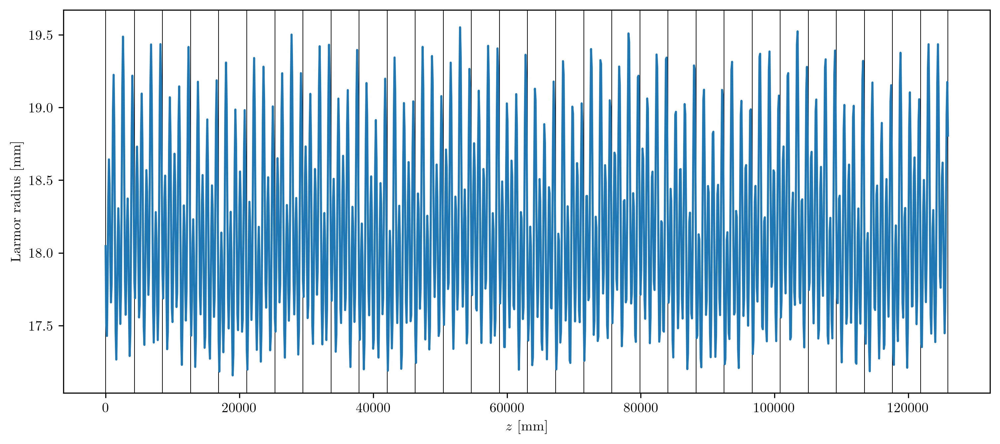

In [101]:
# Compute Larmor radius -- plot for offset particle:
r = []; r_ref = []
for i in range(len(z_vals)):
    r.append(np.sqrt( (x_vals[i])**2 + (y_vals[i])**2))
    r_ref.append(np.sqrt( (x_vals_ref[i])**2 + (y_vals_ref[i])**2))
fig, ax = plt.subplots(figsize=(12,5))
plot_periods(ax)
plt.plot(z_vals,r)
plt.xlabel('$z$ [mm]')
plt.ylabel('Larmor radius [mm]')
plt.show()

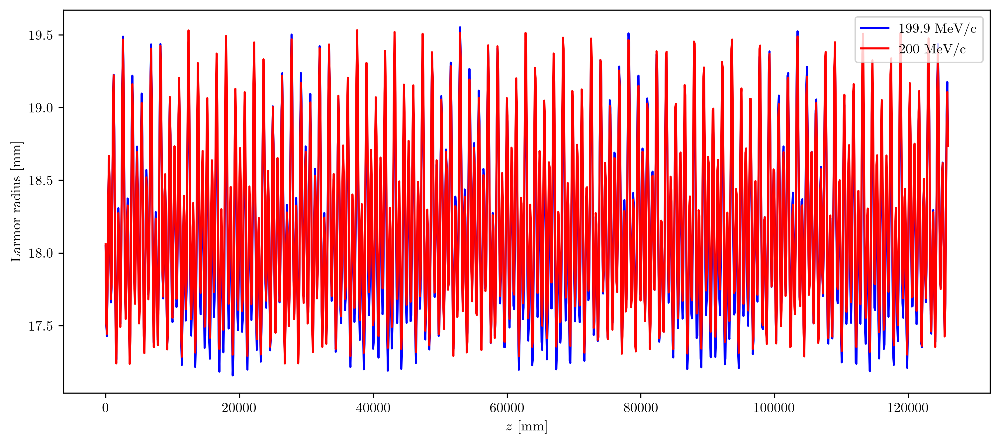

In [110]:
# Compute Larmor radius -- compare offset to nominal:
r = []; r_ref = []
for i in range(len(z_vals)):
    r.append(np.sqrt( (x_vals[i])**2 + (y_vals[i])**2))
    r_ref.append(np.sqrt( (x_vals_ref[i])**2 + (y_vals_ref[i])**2))
plt.figure(figsize=(12,5))
plt.plot(z_vals,r,label=f'{p_offset} MeV/c',color='blue')
plt.plot(z_vals,r_ref,label=f'{p_ref} MeV/c',color='red')
plt.xlabel('$z$ [mm]')
plt.ylabel('Larmor radius [mm]')
plt.legend(loc='upper right')
plt.show()

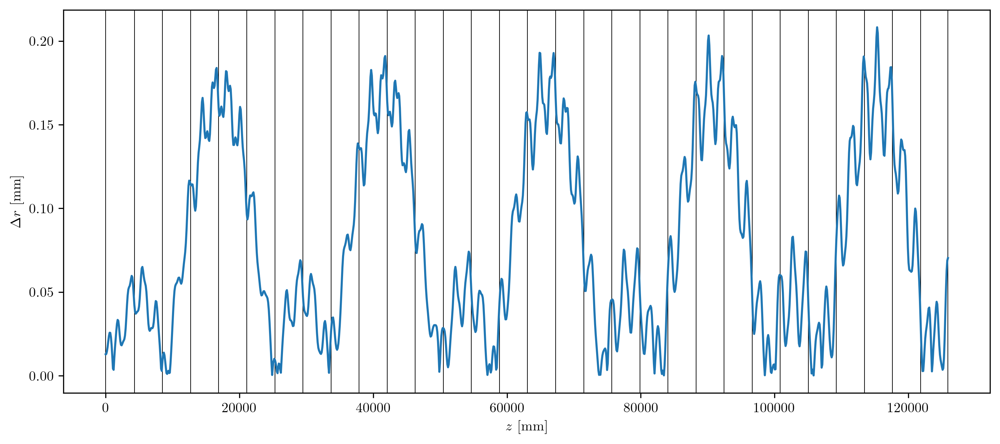

In [105]:
# Compute deviation in Larmor radius:
dr = []
for i in range(len(z_vals)):
    dr.append(abs(r_ref[i]-r[i]))
fig, ax = plt.subplots(figsize=(12,5))
plot_periods(ax)
plt.plot(z_vals,dr)
plt.xlabel('$z$ [mm]')
plt.ylabel('$\Delta r$ [mm]')
plt.show()

### Momenta

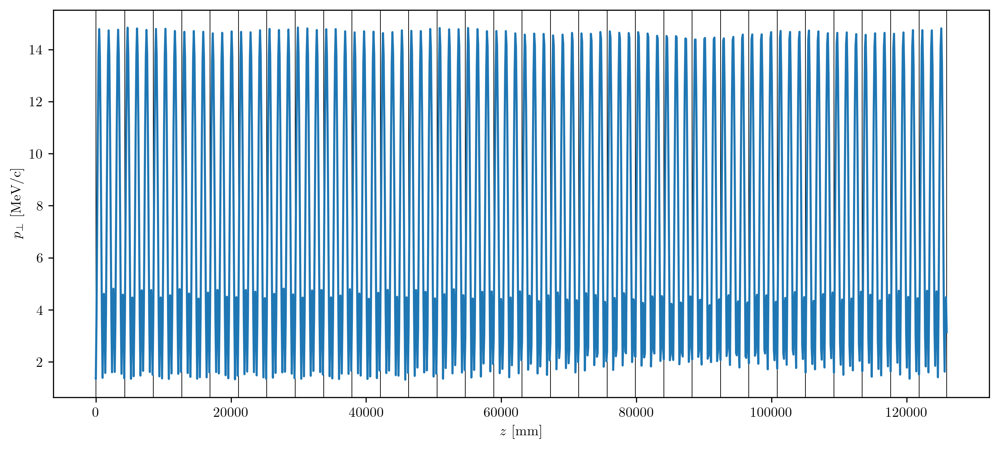

In [117]:
# Plot p_perp along the channel:
fig, ax = plt.subplots(figsize=(12,5))
plot_periods(ax)
plt.plot(z_vals,p_perp_vals)
plt.xlabel('$z$ [mm]')
plt.ylabel(r'$p_{\perp}$ [MeV/c]')
plt.show()

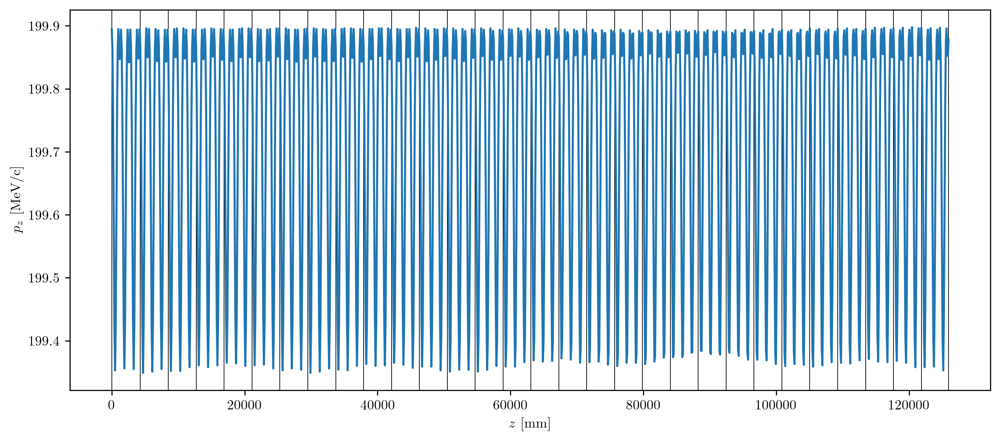

In [119]:
# Plot p_z along the channel:
fig, ax = plt.subplots(figsize=(12,5))
plot_periods(ax)
plt.plot(z_vals,pz_vals)
plt.xlabel('$z$ [mm]')
plt.ylabel('$p_z$ [MeV/c]')
plt.show()

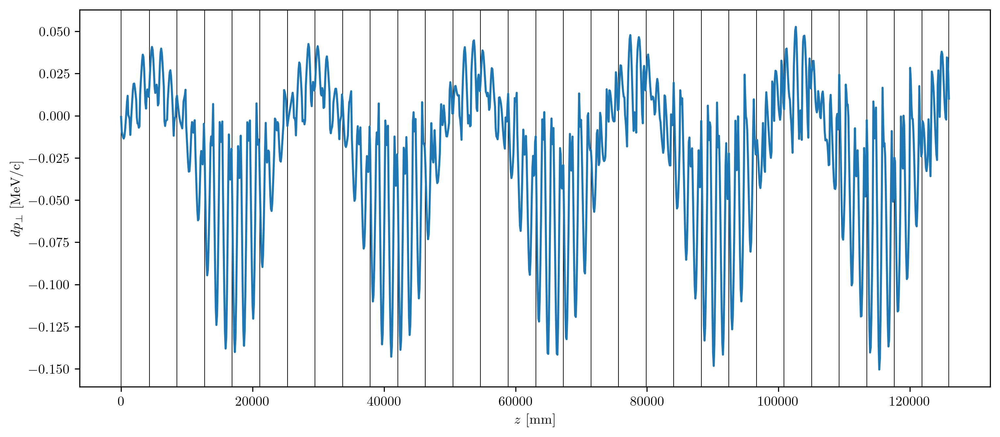

In [121]:
# Plot difference between offset and nominal p_perp along channel:
dp_perp = []
for i in range(len(z_vals)):
    dp_perp.append(p_perp_vals[i]- p_perp_vals_ref[i])
fig, ax = plt.subplots(figsize=(12,5))
plot_periods(ax)
plt.plot(z_vals,dp_perp)
plt.xlabel('$z$ [mm]')
plt.ylabel(r'$dp_{\perp}$ [MeV/c]')
plt.show()

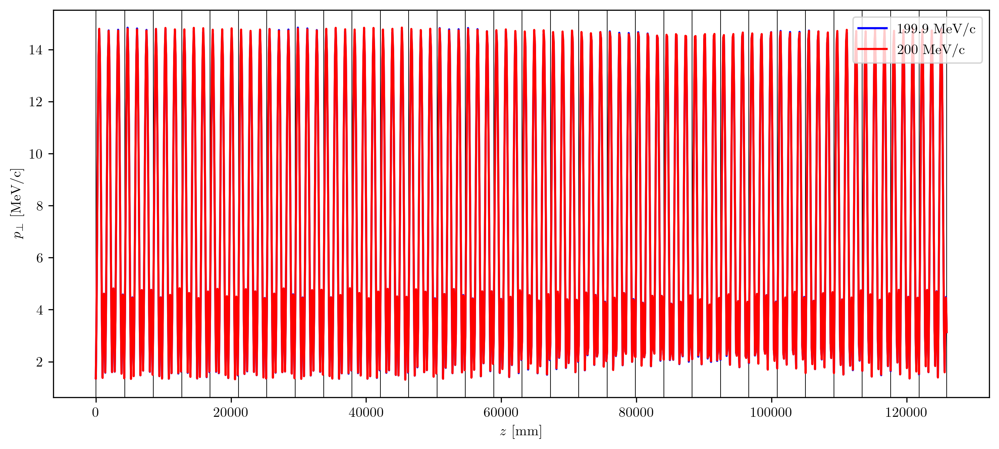

In [124]:
# Plot both offset and nominal p_perp along channel:
fig, ax = plt.subplots(figsize=(12,5))
plot_periods(ax)
plt.plot(z_vals,p_perp_vals,label=f'{p_offset} MeV/c',color='blue')
plt.plot(z_vals,p_perp_vals_ref,label=f'{p_ref} MeV/c',color='red')
plt.xlabel('$z$ [mm]')
plt.ylabel(r'$p_{\perp}$ [MeV/c]')
plt.legend(loc='upper right')
plt.show()

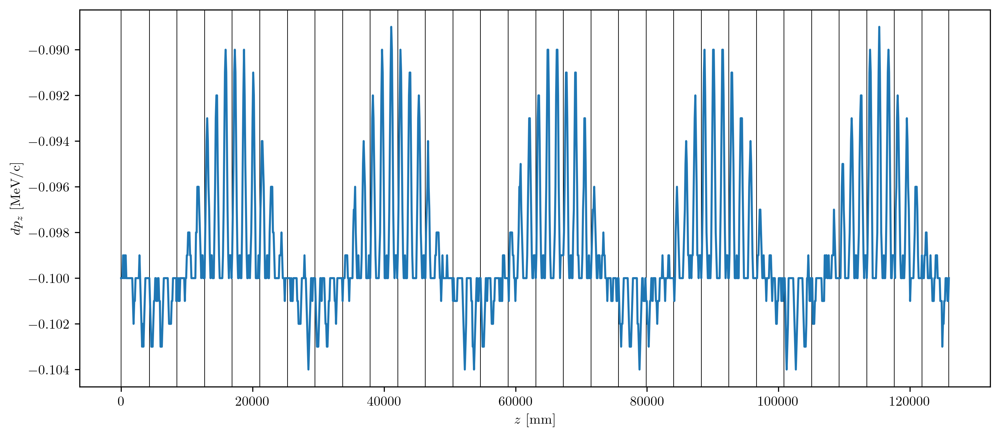

In [125]:
# Plot difference between offset and nominal p_z along channel:
dpz = []
for i in range(len(z_vals)):
    dpz.append(pz_vals[i]- pz_vals_ref[i])
fig, ax = plt.subplots(figsize=(12,5))
plot_periods(ax)
plt.plot(z_vals,dpz)
plt.xlabel('$z$ [mm]')
plt.ylabel('$dp_z$ [MeV/c]')
plt.show()

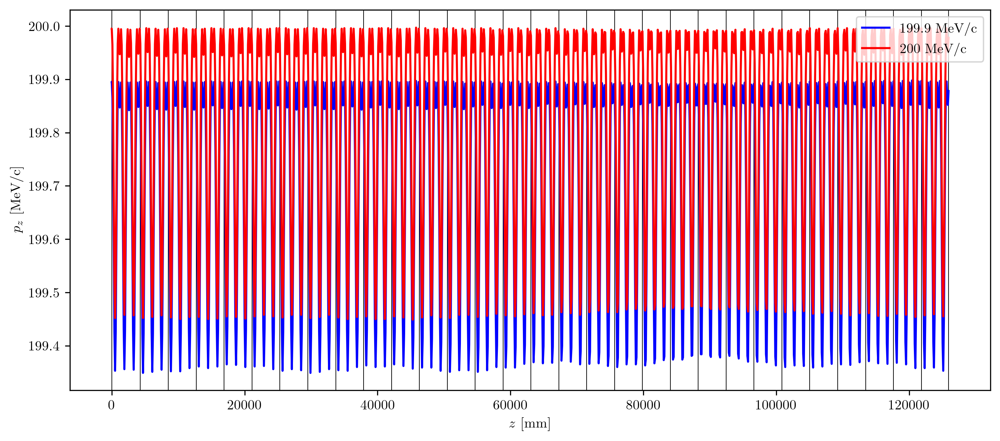

In [129]:
# Plot both offset and nominal p_perp along channel:
fig, ax = plt.subplots(figsize=(12,5))
plot_periods(ax)
plt.plot(z_vals,pz_vals,label=f'{p_offset} MeV/c',color='blue')
plt.plot(z_vals,pz_vals_ref,label=f'{p_ref} MeV/c',color='red')
plt.xlabel('$z$ [mm]')
plt.ylabel('$p_z$ [MeV/c]')
plt.legend(loc='upper right')
plt.show()

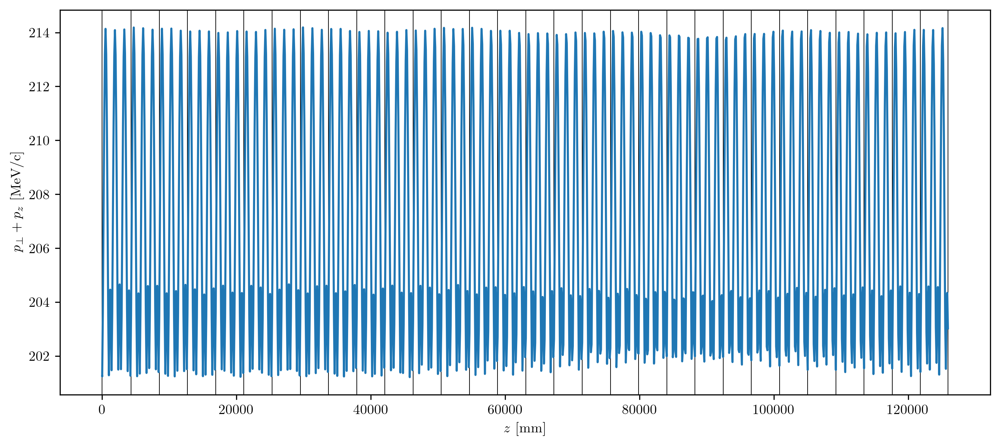

In [128]:
# Plot sum of p_perp and p_z along channel:
p_sum_vals = []
for i in range(len(z_vals)):
    p_sum_vals.append(p_perp_vals[i]+pz_vals[i])
fig, ax = plt.subplots(figsize=(12,5))
plot_periods(ax)
plt.plot(z_vals,p_sum_vals)
plt.xlabel('$z$ [mm]')
plt.ylabel(r'$p_{\perp} + p_z$ [MeV/c]')
plt.show()

### FFT

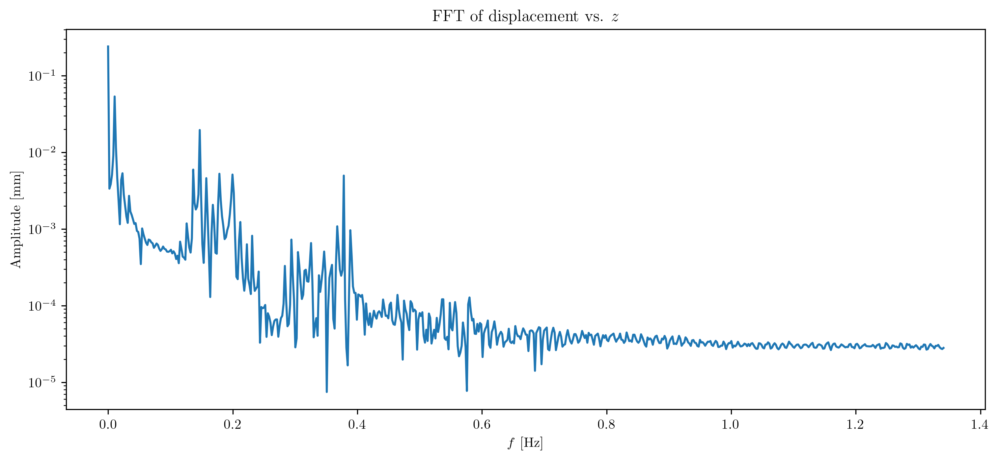

In [130]:
##### FFT displacements in time basis #####

# Evenly space z values:
t_uniform = np.linspace(np.min(t_vals), np.max(t_vals), len(t_vals))
displacements_interp_func = interp1d(t_vals, displacements)
displacements_uniform = displacements_interp_func(t_uniform)

# Perform FFT:
fft = np.fft.fft(displacements_uniform)
dt = t_uniform[1] - t_uniform[0]
N = len(t_uniform)
freqs = np.fft.fftfreq(N, d=dt)

# Normalize amplitudes:
amplitude = 2 * np.abs(fft) / N

# Only take positive wave numbers:
half_N = N // 2
positive_freqs = freqs[:half_N]
positive_amplitude = amplitude[:half_N]

# Plot FFT:
plt.figure(figsize=(12, 5))
plt.plot(positive_freqs, positive_amplitude)
plt.yscale('log')
plt.xlabel('$f$ [Hz]')
plt.ylabel('Amplitude [mm]')
plt.title('FFT of displacement vs. $z$')
plt.show()

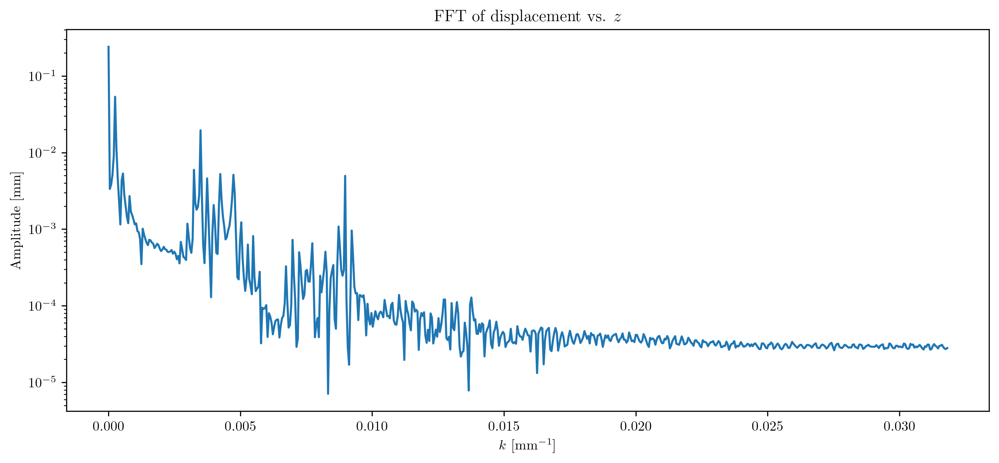

In [151]:
##### FFT displacements in position basis #####

# Evenly space z values:
z_uniform = np.linspace(np.min(z_vals), np.max(z_vals), len(z_vals))
displacements_interp_func = interp1d(z_vals, displacements)
displacements_uniform = displacements_interp_func(z_uniform)

# Perform FFT:
fft = np.fft.fft(displacements_uniform)
dz = z_uniform[1] - z_uniform[0]
N = len(z_uniform)

# Units conversion:
k_cyclic = np.fft.fftfreq(N, d=dz)  # cycles/cm
k_radians = 2 * np.pi * k_cyclic    # radians/cm

# Normalize amplitudes:
amplitude = 2 * np.abs(fft) / N

# Only take positive wave numbers:
half_N = N // 2
positive_k = k_radians[:half_N]
positive_amplitude = amplitude[:half_N]

# Plot FFT:
# %matplotlib widget
plt.figure(figsize=(12, 5))
plt.plot(positive_k, positive_amplitude)
plt.yscale('log')
plt.xlabel('$k$ [mm$^{-1}$]')
plt.ylabel('Amplitude [mm]')
plt.title('FFT of displacement vs. $z$')
plt.show()

### Dispersion

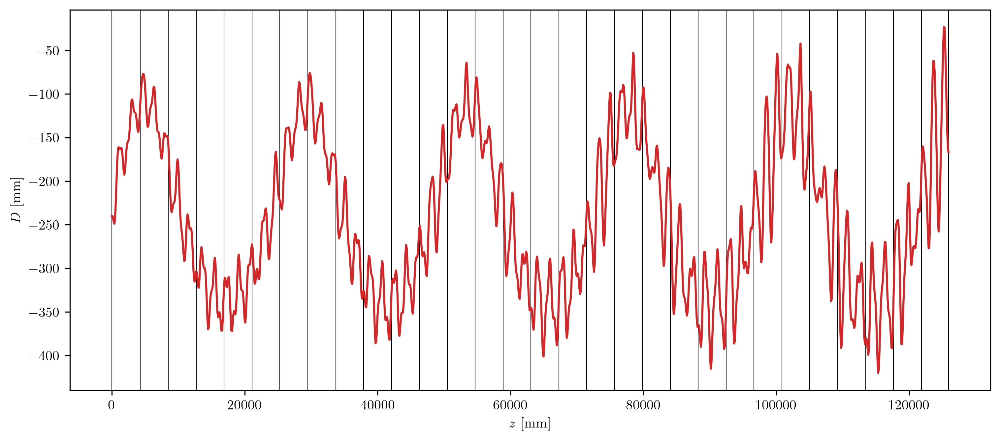

In [133]:
# Plot dispersion:
dp_p = (p_offset-p_ref)/p_ref
D = []
for i in range(len(z_vals)):
    D.append(displacements[i]/dp_p)
fig, ax = plt.subplots(figsize=(12,5))
plot_periods(ax)
plt.plot(z_vals,D, color='tab:red')
plt.ylabel('$D$ [mm]')
plt.xlabel('$z$ [mm]')
plt.show()

In [146]:
### Define function to plot lines indicating solenoid placement:
n=6; d = 700; L=300
def plot_solenoids(ax, zshift=0, legend=True):
    cnt1 = 0; cnt2 = 0
    for i in range(n):
        center =  i*d + zshift
        if np.mod(i,2) == 0: # positive polarity
            if cnt1 == 0 and legend:
                ax.axvspan(xmin=center-L/2, xmax=center+L/2, color='gray', alpha=0.2, label='$+$')
                cnt1 += 1
            else:
                ax.axvspan(xmin=center-L/2, xmax=center+L/2, color='gray', alpha=0.2)
        else: # negative polarity
            if cnt2 == 0 and legend:
                ax.axvspan(xmin=center-L/2, xmax=center+L/2, color='black', alpha=0.2, label='$-$')
                cnt2 += 1
            else:
                ax.axvspan(xmin=center-L/2, xmax=center+L/2, color='black', alpha=0.2)

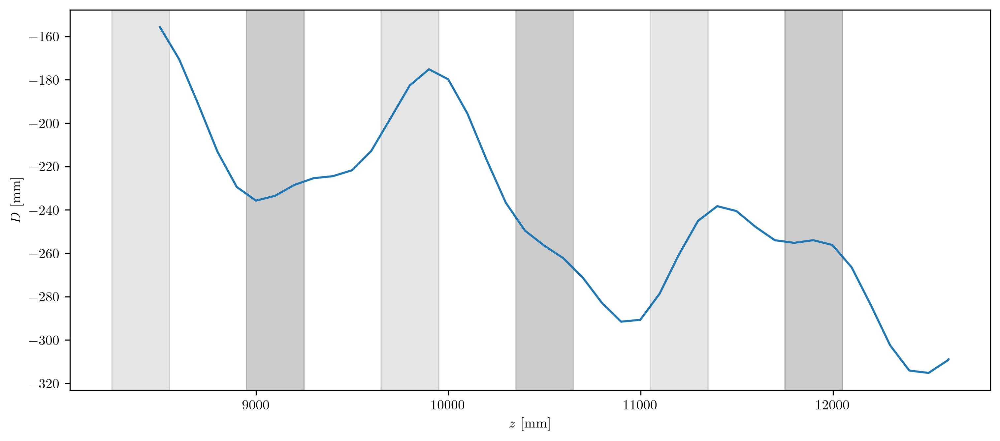

In [150]:
# Plot dispersion for single period:
val = 2
start = 0+val; end = 1+val
fig, ax = plt.subplots(figsize=(12,5))
plot_solenoids(ax, zshift=val*len_period)
plt.plot(z_vals[period_start_indices[start]:period_start_indices[end]],D[period_start_indices[start]:period_start_indices[end]])
plt.ylabel('$D$ [mm]')
plt.xlabel('$z$ [mm]')
plt.show()

In [139]:
# Calculate x,y dispersion along channel:
x_disp = []
y_disp = []
for i in range(len(z_vals)):
    x_disp.append((x_vals[i] - x_vals_ref[i]))
    y_disp.append((y_vals[i] - y_vals_ref[i]))
D_x = []
D_y = []
for i in range(len(z_vals)):
    D_x.append(x_disp[i]/dp_p)
    D_y.append(y_disp[i]/dp_p)

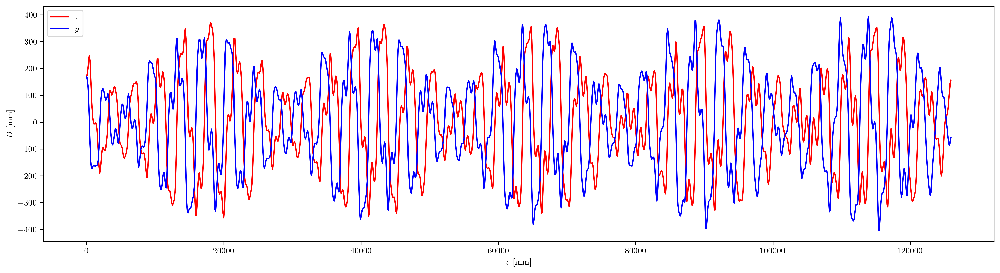

In [143]:
# Plot x,y dispersion from reference particle along channel:
plt.figure(figsize=(20,5))
plt.plot(z_vals,D_x,color='red',label='$x$')
plt.plot(z_vals,D_y,color='blue',label='$y$')
plt.xlabel('$z$ [mm]')
plt.ylabel('$D$ [mm]')
plt.legend(loc='upper left')
plt.show()

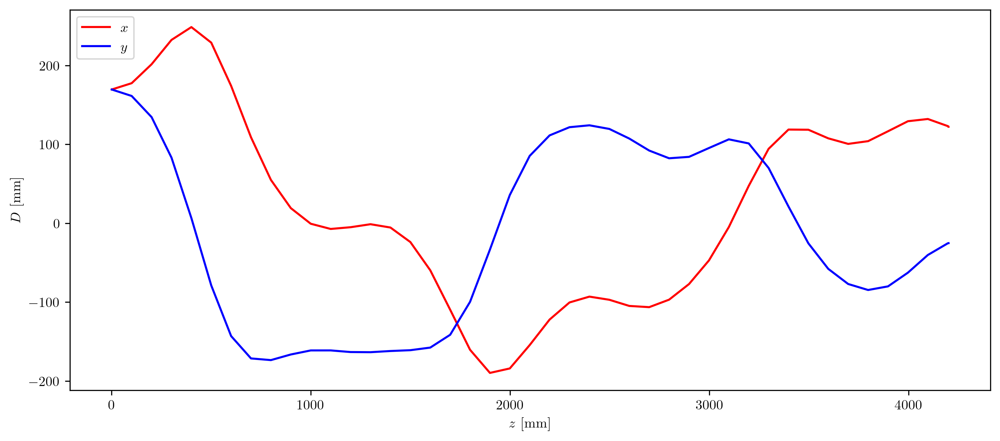

In [142]:
# Plot x,y dispersion for first period only:
plt.figure(figsize=(12,5))
plt.plot(z_vals[period_start_indices[0]:period_start_indices[1]],D_x[period_start_indices[0]:period_start_indices[1]],color='red',label='$x$')
plt.plot(z_vals[period_start_indices[0]:period_start_indices[1]],D_y[period_start_indices[0]:period_start_indices[1]],color='blue',label='$y$')
plt.xlabel('$z$ [mm]')
plt.ylabel('$D$ [mm]')
plt.legend(loc='upper left')
plt.show()

### Testing zone

Full channel

In [57]:
data_dp_pos = readTraceData('AllTracks_dp_pos.txt')
data_dp_neg = readTraceData('AllTracks_dp_neg.txt')
data_no_dp = readTraceData('AllTracks_p0.txt')

period_start = 0; period_end = 30
nperiods = period_end - period_start
zcut1 = period_start*len_period + 350; zcut2 = period_end*len_period + 350
data_dp_pos = data_dp_pos[data_dp_pos['z'] > zcut1]
data_dp_pos = data_dp_pos[data_dp_pos['z'] < zcut2]
data_dp_neg = data_dp_neg[data_dp_neg['z'] > zcut1]
data_dp_neg = data_dp_neg[data_dp_neg['z'] < zcut2]
data_no_dp = data_no_dp[data_no_dp['z'] > zcut1]
data_no_dp = data_no_dp[data_no_dp['z'] < zcut2]

# EventID == -1 --> reference particle
data_dp_pos = data_dp_pos[data_dp_pos['EventID'] == -1]
data_dp_neg = data_dp_neg[data_dp_neg['EventID'] == -1]
data_no_dp = data_no_dp[data_no_dp['EventID'] == -1]

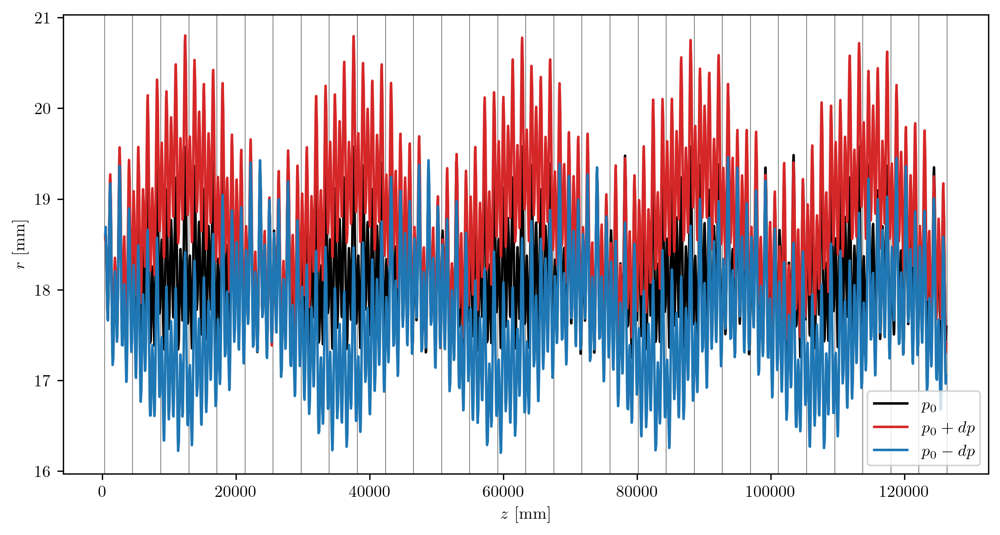

In [58]:
########## r vs. z ##########

fig, ax = plt.subplots(figsize=(10,5))
plt.plot(data_no_dp['z'], data_no_dp['r'], color='black', label='$p_0$')
plt.plot(data_dp_pos['z'], data_dp_pos['r'], color='tab:red', label='$p_0+dp$')
plt.plot(data_dp_neg['z'], data_dp_neg['r'], color='tab:blue', label='$p_0-dp$')
if nperiods > 1:
    for i in range(nperiods+1):
        ax.axvline(len_period*i + 350, color='gray', linewidth=0.5, zorder=-10)
plt.ylabel('$r$ [mm]')
plt.xlabel('$z$ [mm]')
plt.legend()
plt.show()

Single period

In [153]:
data_dp_pos = readTraceData('AllTracks_dp_pos.txt')
data_dp_neg = readTraceData('AllTracks_dp_neg.txt')
data_no_dp = readTraceData('AllTracks_p0.txt')

eps = 100
period_start = 5; period_end = 6
nperiods = period_end - period_start
zcut1 = period_start*len_period + 350 - eps; zcut2 = period_end*len_period + 350 + eps
data_dp_pos = data_dp_pos[data_dp_pos['z'] > zcut1]
data_dp_pos = data_dp_pos[data_dp_pos['z'] < zcut2]
data_dp_neg = data_dp_neg[data_dp_neg['z'] > zcut1]
data_dp_neg = data_dp_neg[data_dp_neg['z'] < zcut2]
data_no_dp = data_no_dp[data_no_dp['z'] > zcut1]
data_no_dp = data_no_dp[data_no_dp['z'] < zcut2]

# EventID == -1 --> reference particle
data_dp_pos = data_dp_pos[data_dp_pos['EventID'] == -1]
data_dp_neg = data_dp_neg[data_dp_neg['EventID'] == -1]
data_no_dp = data_no_dp[data_no_dp['EventID'] == -1]

In [154]:
# Define function to plot lines indicating solenoid placement:
n = 6*nperiods
L = 300
def plot_solenoids(ax, zshift=0, legend=True):
    cnt1 = 0; cnt2 = 0
    for i in range(n):
        center = 700*i + 500 + zshift
        if np.mod(i,2) == 0: # positive polarity
            if cnt1 == 0 and legend:
                ax.axvspan(xmin=center-L/2, xmax=center+L/2, color='gray', alpha=0.2, label='$+$')
                cnt1 += 1
            else:
                ax.axvspan(xmin=center-L/2, xmax=center+L/2, color='gray', alpha=0.2)
        else: # negative polarity
            if cnt2 == 0 and legend:
                ax.axvspan(xmin=center-L/2, xmax=center+L/2, color='black', alpha=0.2, label='$-$')
                cnt2 += 1
            else:
                ax.axvspan(xmin=center-L/2, xmax=center+L/2, color='black', alpha=0.2)

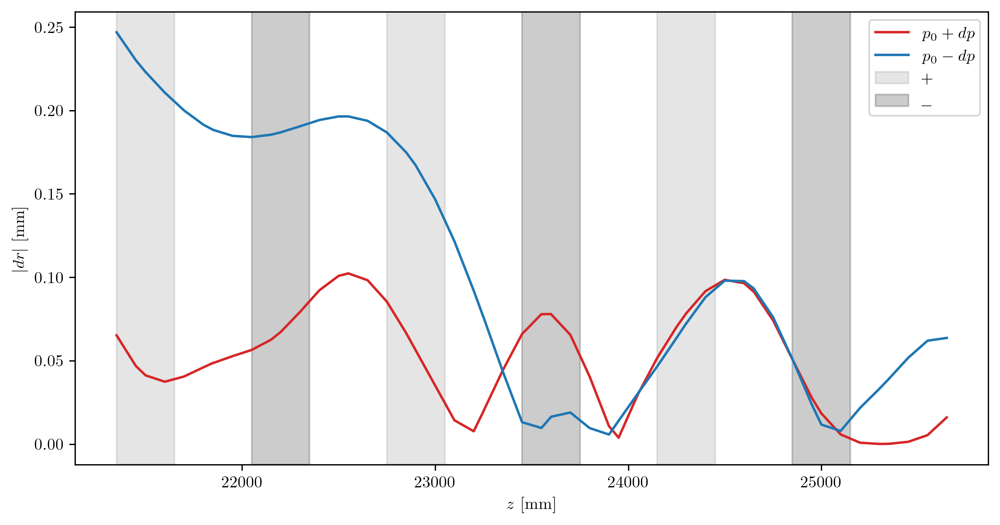

In [155]:
########## dr vs. z ##########

dr_vals_neg = abs( data_dp_neg['r'] - data_no_dp['r'] )
dr_vals_pos = abs( data_dp_pos['r'] - data_no_dp['r'] )
fig, ax = plt.subplots(figsize=(10,5))
plt.plot(data_dp_pos['z'], dr_vals_neg, color='tab:red', label='$p_0+dp$')
plt.plot(data_dp_neg['z'], dr_vals_pos, color='tab:blue', label='$p_0-dp$')
plot_solenoids(ax, zshift=period_start*len_period)
plt.ylabel('$|dr|$ [mm]')
plt.xlabel('$z$ [mm]')
plt.legend()
plt.show()

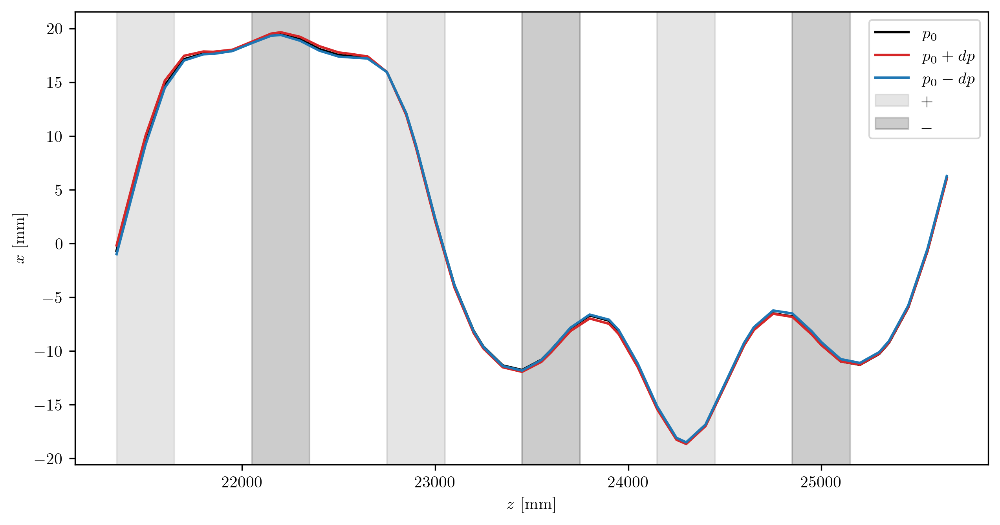

In [156]:
########## x vs. z ##########

fig, ax = plt.subplots(figsize=(10,5))
plt.plot(data_no_dp['z'], data_no_dp['x'], color='black', label='$p_0$')
plt.plot(data_dp_pos['z'], data_dp_pos['x'], color='tab:red', label='$p_0+dp$')
plt.plot(data_dp_neg['z'], data_dp_neg['x'], color='tab:blue', label='$p_0-dp$')
plot_solenoids(ax, zshift=period_start*len_period)
plt.ylabel('$x$ [mm]')
plt.xlabel('$z$ [mm]')
plt.legend()
plt.show()

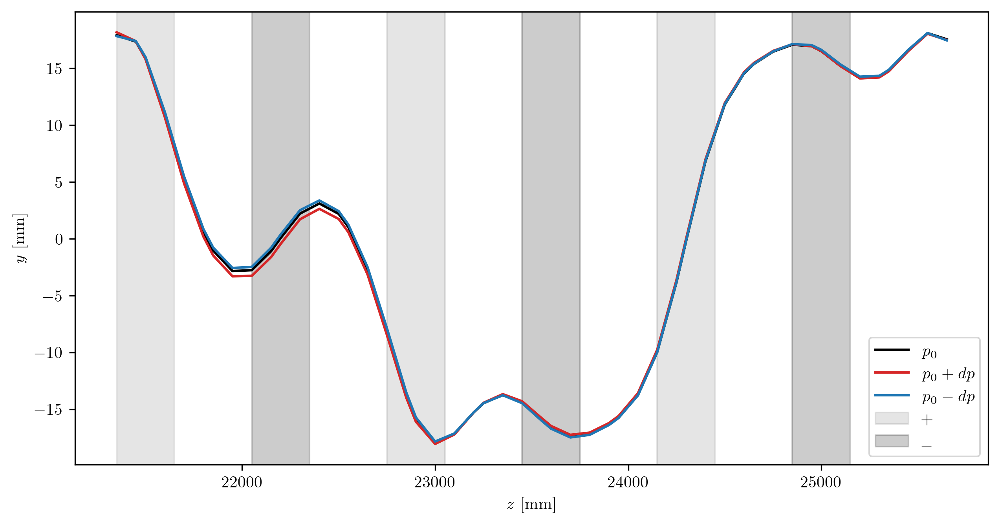

In [157]:
########## y vs. z ##########

fig, ax = plt.subplots(figsize=(10,5))
plt.plot(data_no_dp['z'], data_no_dp['y'], color='black', label='$p_0$')
plt.plot(data_dp_pos['z'], data_dp_pos['y'], color='tab:red', label='$p_0+dp$')
plt.plot(data_dp_neg['z'], data_dp_neg['y'], color='tab:blue', label='$p_0-dp$')
plot_solenoids(ax, zshift=period_start*len_period)
plt.ylabel('$y$ [mm]')
plt.xlabel('$z$ [mm]')
plt.legend()
plt.show()

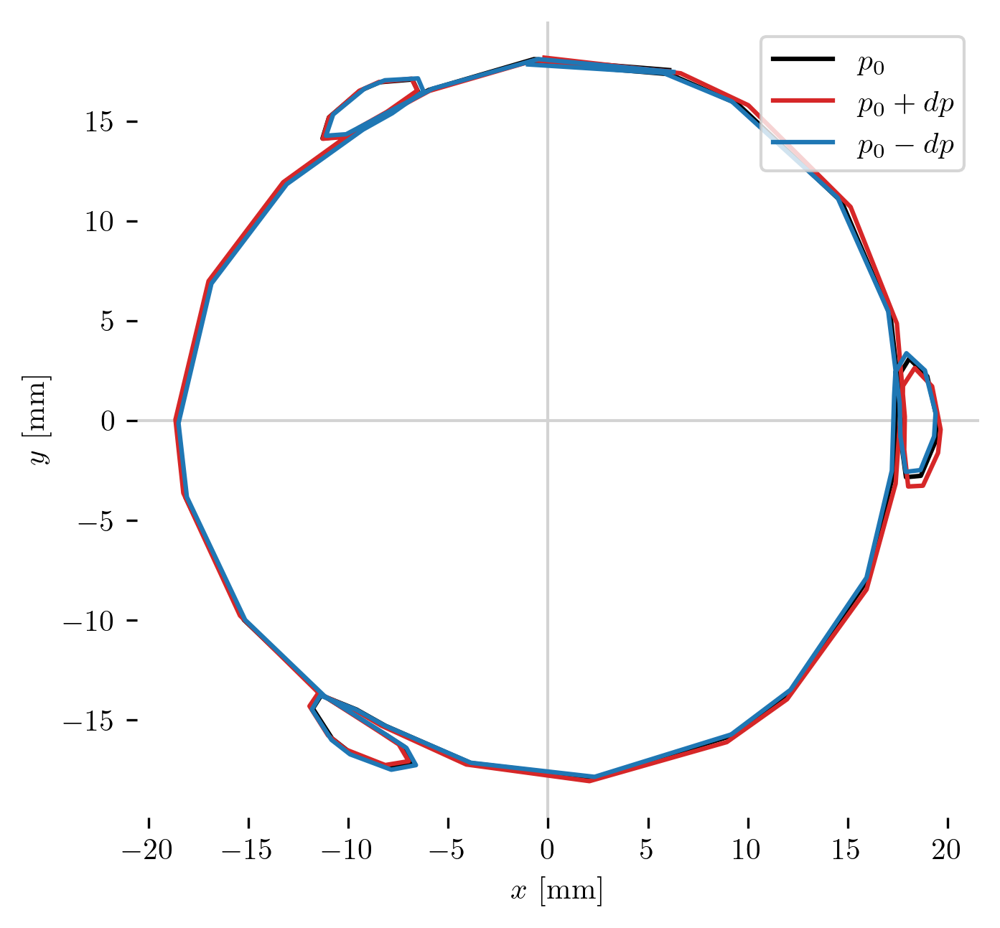

In [158]:
########## Orbit in transverse plane ##########

fig, ax = plt.subplots()
plt.plot(data_no_dp['x'], data_no_dp['y'], color='black', label='$p_0$')
plt.plot(data_dp_pos['x'], data_dp_pos['y'], color='tab:red', label='$p_0+dp$')
plt.plot(data_dp_neg['x'], data_dp_neg['y'], color='tab:blue', label='$p_0-dp$')
for spine in ['top', 'right', 'bottom', 'left']:
    plt.gca().spines[spine].set_visible(False)
plt.axhline(0, color='lightgray', linewidth=1, zorder=-10)
plt.axvline(0, color='lightgray', linewidth=1, zorder=-10)
plt.xlabel('$x$ [mm]')
plt.ylabel('$y$ [mm]')
ax.set_aspect('equal')
plt.legend(loc='upper right')
plt.show()

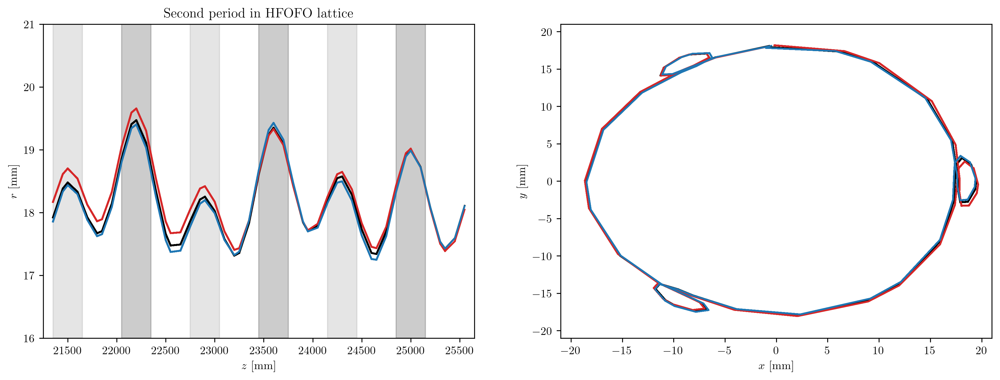

In [159]:
########## r vs. z and orbit in transverse plane ##########

from matplotlib.animation import FuncAnimation

fig, (ax1, ax2) = plt.subplots(1,2, figsize=(15, 5))
def animate(frame):

    # r vs. z
    ax1.plot(data_no_dp['z'][:frame], data_no_dp['r'][:frame], color='black', label='$p_0$')
    ax1.plot(data_dp_pos['z'][:frame], data_dp_pos['r'][:frame], color='tab:red', label='$p_0+dp$')
    ax1.plot(data_dp_neg['z'][:frame], data_dp_neg['r'][:frame], color='tab:blue', label='$p_0-dp$')
    ax1.set_ylim((16,21))
    ax1.set_xlim(zcut1, zcut2)
    ax1.set_xlabel('$z$ [mm]')
    ax1.set_ylabel('$r$ [mm]')
    ax1.set_title('Second period in HFOFO lattice')

    # y vs. x
    ax2.plot(data_no_dp['x'][:frame], data_no_dp['y'][:frame], color='black', label='$p_0$')
    ax2.plot(data_dp_pos['x'][:frame], data_dp_pos['y'][:frame], color='tab:red', label='$p_0+dp$')
    ax2.plot(data_dp_neg['x'][:frame], data_dp_neg['y'][:frame], color='tab:blue', label='$p_0-dp$')
    ax2.set_xlim((-21,21))
    ax2.set_ylim((-21,21))
    ax2.set_xlabel('$x$ [mm]')
    ax2.set_ylabel('$y$ [mm]')
    
plot_solenoids(ax1, zshift=period_start*len_period)
animation = FuncAnimation(fig, animate, frames=len(data_no_dp['z']), interval=400, repeat=True)
animation.save('test.gif', writer='pillow')

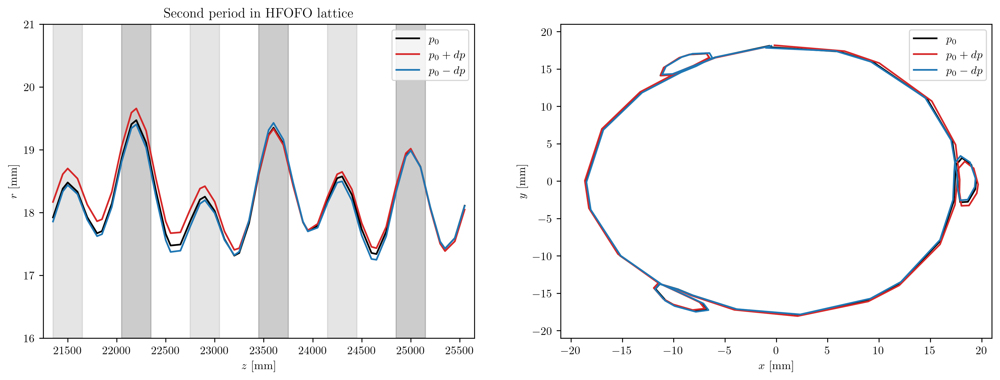

In [160]:
from matplotlib.animation import FuncAnimation
import matplotlib.pyplot as plt

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))

# Initialize line objects for r vs. z
line_rz_no_dp, = ax1.plot([], [], color='black', label='$p_0$')
line_rz_dp_pos, = ax1.plot([], [], color='tab:red', label='$p_0+dp$')
line_rz_dp_neg, = ax1.plot([], [], color='tab:blue', label='$p_0-dp$')

# Initialize line objects for x vs. y
line_xy_no_dp, = ax2.plot([], [], color='black', label='$p_0$')
line_xy_dp_pos, = ax2.plot([], [], color='tab:red', label='$p_0+dp$')
line_xy_dp_neg, = ax2.plot([], [], color='tab:blue', label='$p_0-dp$')

# Static plot formatting
ax1.set_ylim((16, 21))
ax1.set_xlim(zcut1, zcut2)
ax1.set_xlabel('$z$ [mm]')
ax1.set_ylabel('$r$ [mm]')
ax1.set_title('Second period in HFOFO lattice')
ax1.legend(loc='upper right')

ax2.set_xlim((-21, 21))
ax2.set_ylim((-21, 21))
ax2.set_xlabel('$x$ [mm]')
ax2.set_ylabel('$y$ [mm]')
ax2.legend(loc='upper right')

# Plot solenoids once
plot_solenoids(ax1, zshift=period_start * len_period)

def animate(frame):
    # Update data for r vs. z
    line_rz_no_dp.set_data(data_no_dp['z'][:frame], data_no_dp['r'][:frame])
    line_rz_dp_pos.set_data(data_dp_pos['z'][:frame], data_dp_pos['r'][:frame])
    line_rz_dp_neg.set_data(data_dp_neg['z'][:frame], data_dp_neg['r'][:frame])
    
    # Update data for x vs. y
    line_xy_no_dp.set_data(data_no_dp['x'][:frame], data_no_dp['y'][:frame])
    line_xy_dp_pos.set_data(data_dp_pos['x'][:frame], data_dp_pos['y'][:frame])
    line_xy_dp_neg.set_data(data_dp_neg['x'][:frame], data_dp_neg['y'][:frame])
    
    return (line_rz_no_dp, line_rz_dp_pos, line_rz_dp_neg,
            line_xy_no_dp, line_xy_dp_pos, line_xy_dp_neg)

animation = FuncAnimation(fig, animate, frames=len(data_no_dp['z']), interval=400, blit=True, repeat=True)
animation.save('test.gif', writer='pillow')
